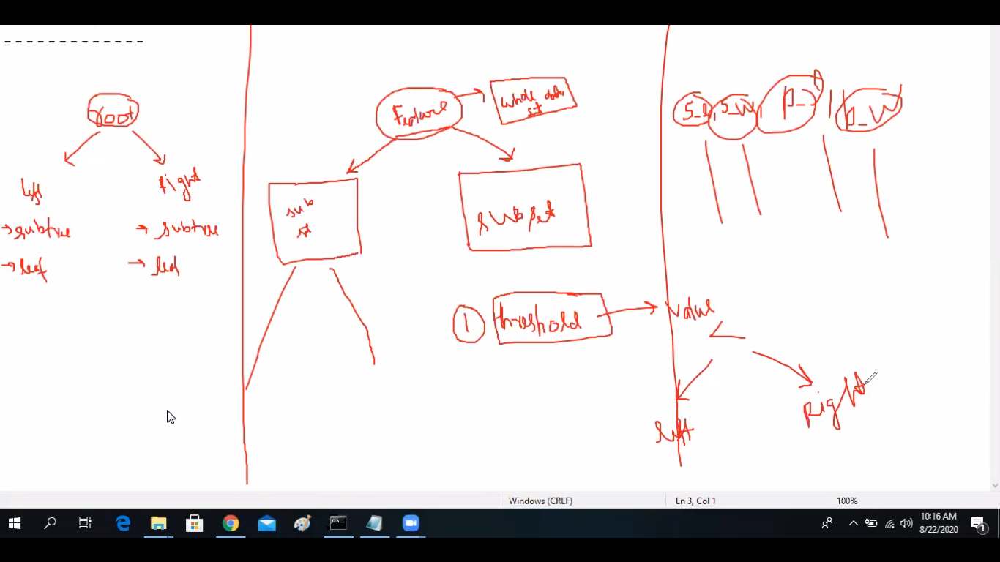

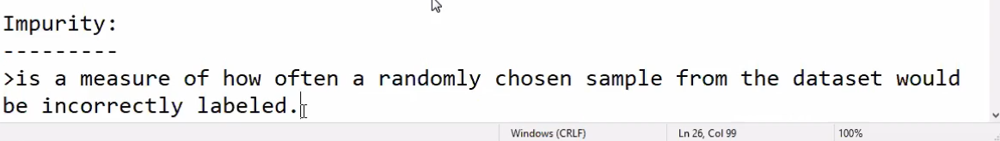

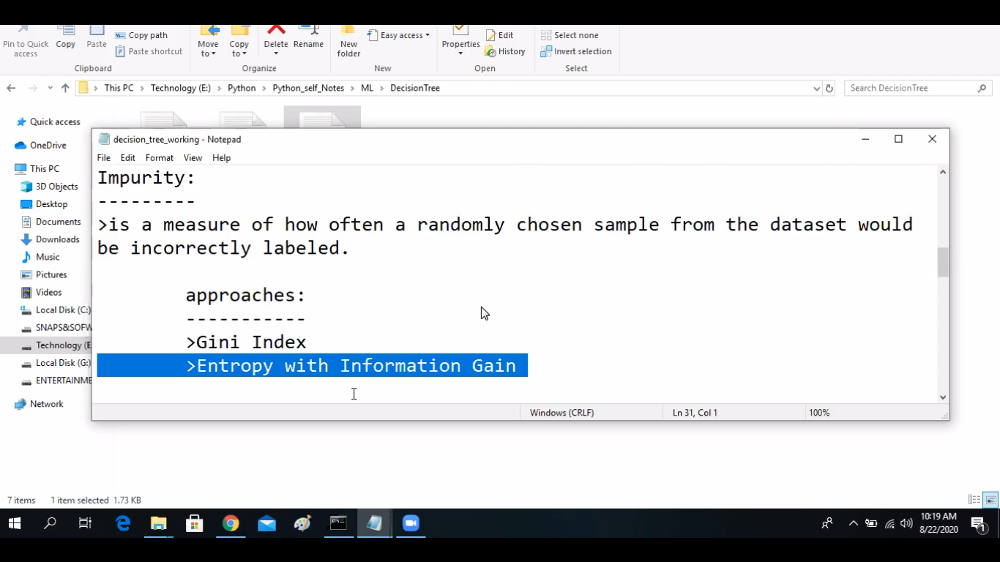

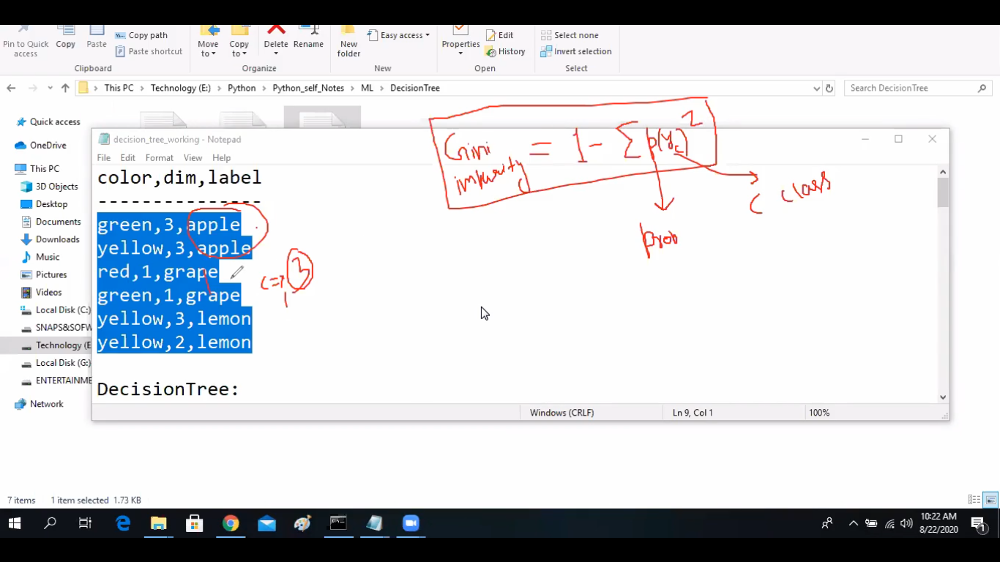

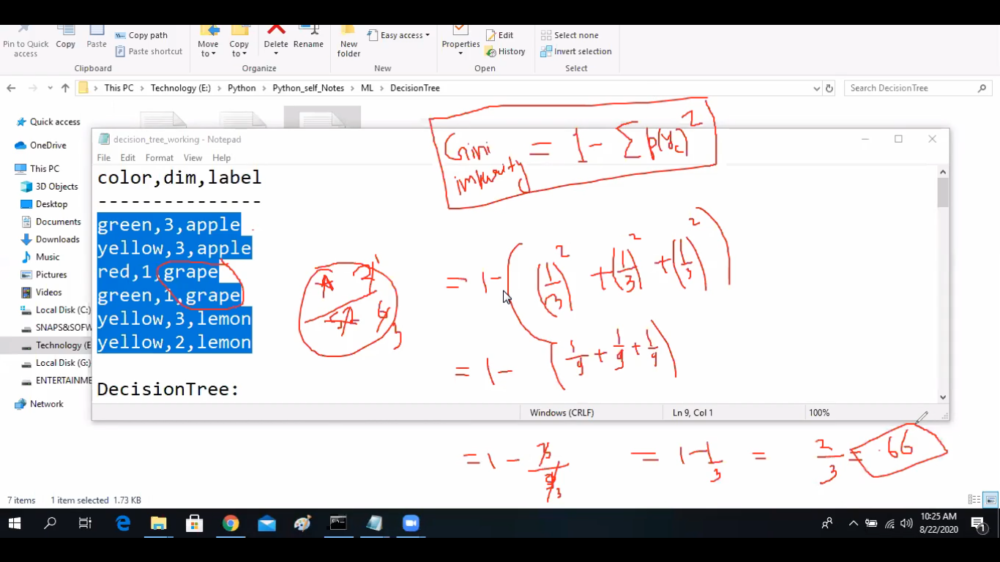

## How to calculate weighted average-impurity

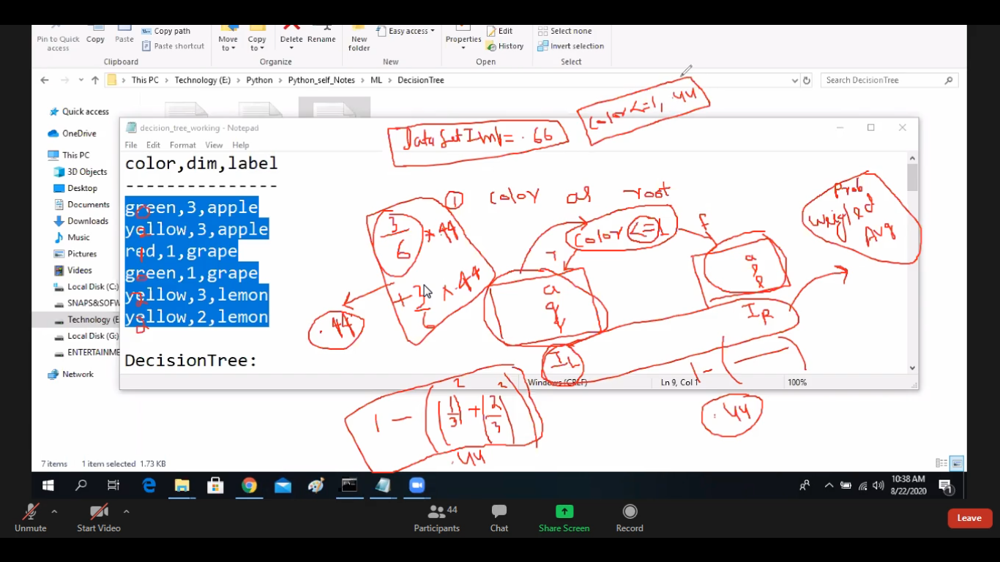

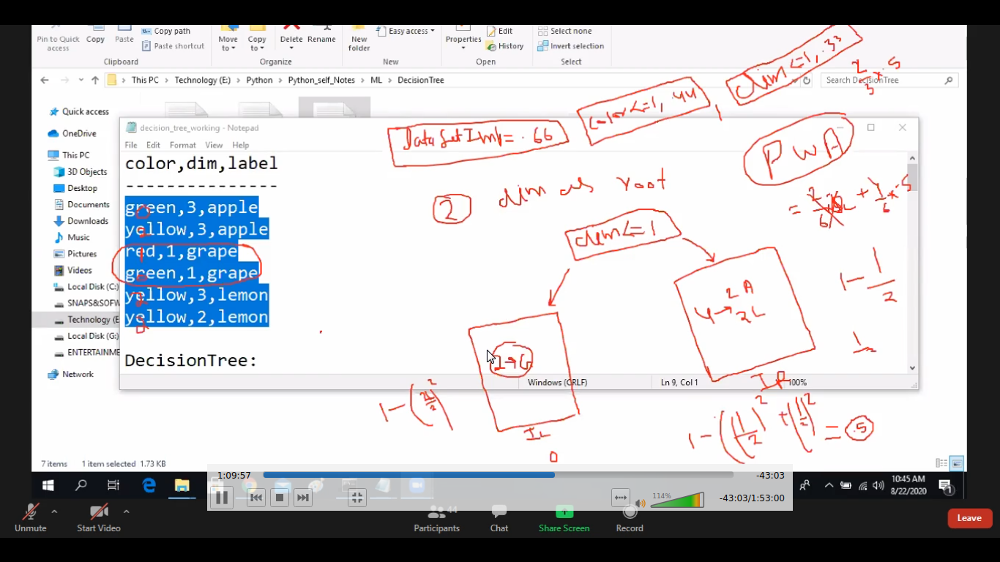

In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier , plot_tree

In [2]:
df = pd.read_csv('/home/echelon/machine_learning_personal/machine learning/dataset/classification/data_tree.txt')
df.color = df.color.map({'green':0,'yellow':1,'red':1}) 
df

,color,dim,label
0,0,3,apple
1,1,3,lemon
2,1,3,apple
3,1,1,grape
4,0,1,grape
5,1,2,lemon


In [3]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values

In [4]:
dtc = DecisionTreeClassifier(criterion='gini')
dtc.fit(X,y) 

DecisionTreeClassifier()

In [5]:
import matplotlib.pyplot as plt 

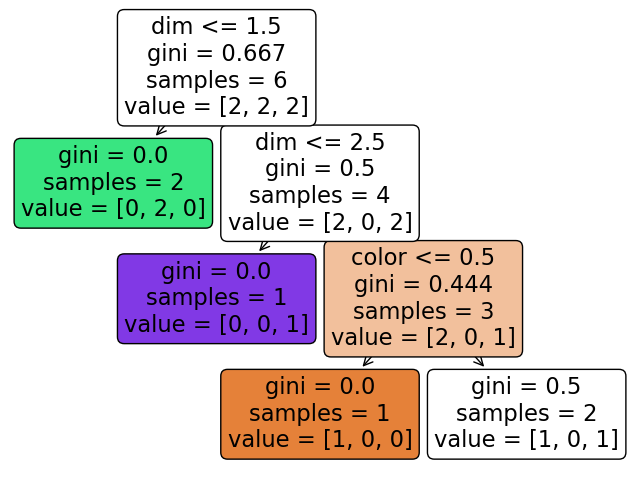

In [6]:
plt.figure(figsize=(8,6))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

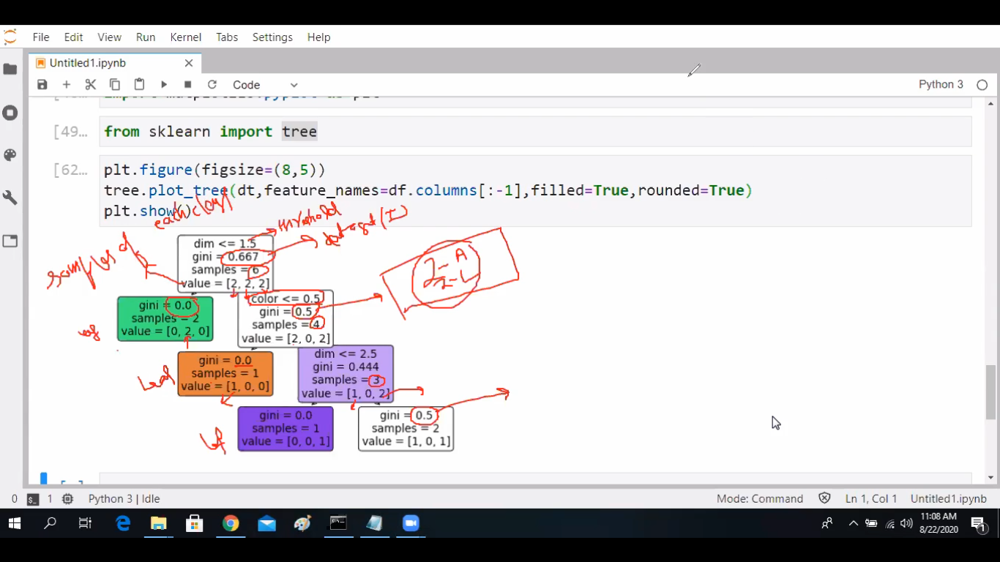

### mostly threshold average value compute kr ke nikalti hai ye algorithm

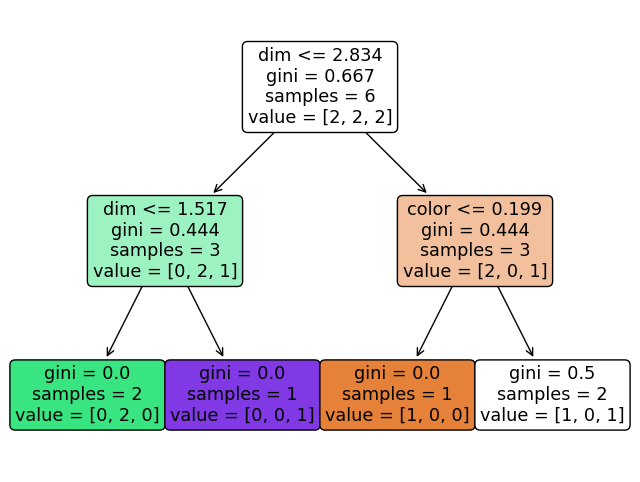

In [7]:
# yhan splitter argument jo hai vo threshold ki value ko decide krn me help krta hai
# splitter='random' ki value shi nhi maani jati hai kyunki hr bar threshold ki value change hoti rehti hai

dtc = DecisionTreeClassifier(criterion='gini',splitter='random')
dtc.fit(X,y)
plt.figure(figsize=(8,6))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

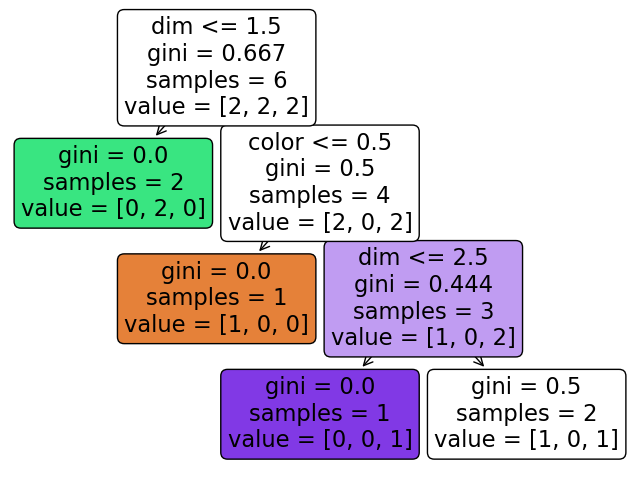

CPU times: user 237 ms, sys: 3.6 ms, total: 240 ms
Wall time: 239 ms


In [8]:
%%time
dtc = DecisionTreeClassifier(criterion='gini',splitter='best') # splitter = 'best'
dtc.fit(X,y)
plt.figure(figsize=(8,6))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

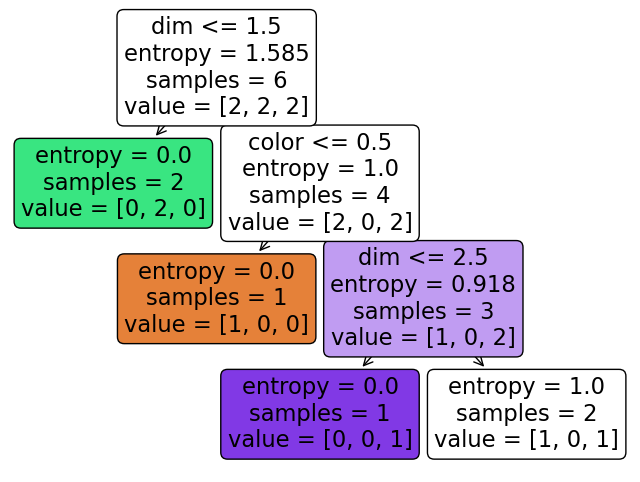

CPU times: user 248 ms, sys: 0 ns, total: 248 ms
Wall time: 247 ms


In [10]:
%%time
dtc = DecisionTreeClassifier(criterion='entropy',splitter='best') # splitter = 'best'
dtc.fit(X,y)
plt.figure(figsize=(8,6))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

In [11]:
df = pd.read_csv('/home/echelon/machine_learning_personal/machine learning/dataset/classification/iris.csv')
df

,sepal_length,sepal_width,petal_length,petal_width,class
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


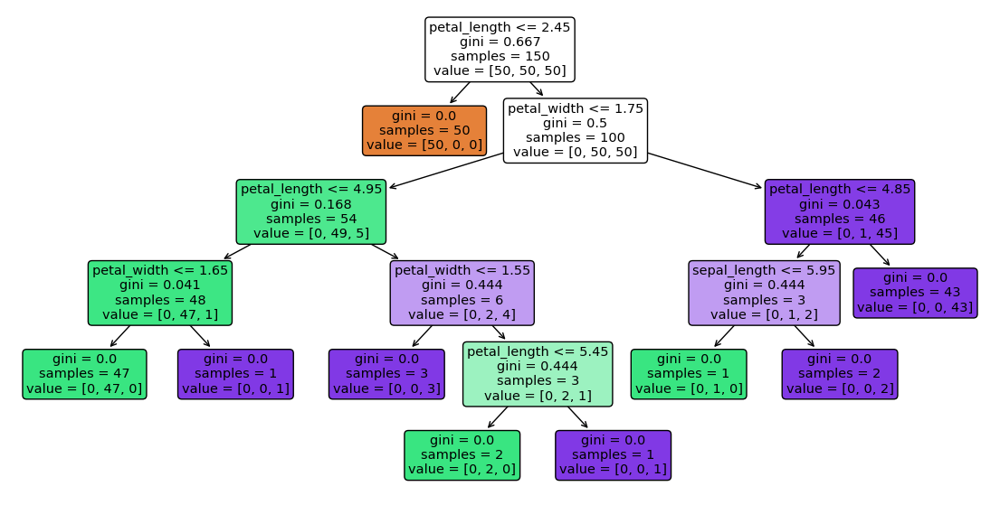

In [12]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values
dtc = DecisionTreeClassifier(criterion='gini',splitter='best')
dtc.fit(X,y)
plt.figure(figsize=(14,7))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

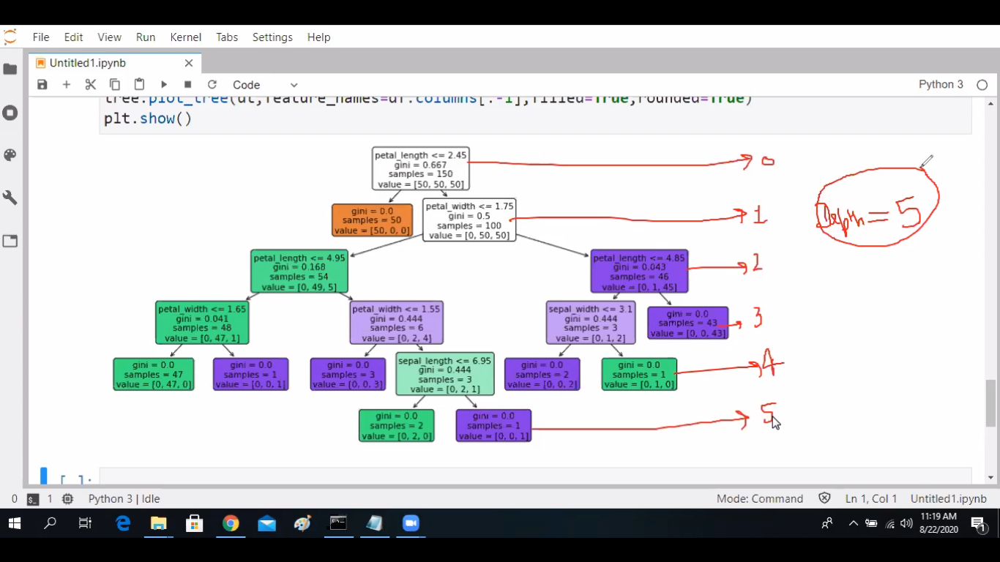

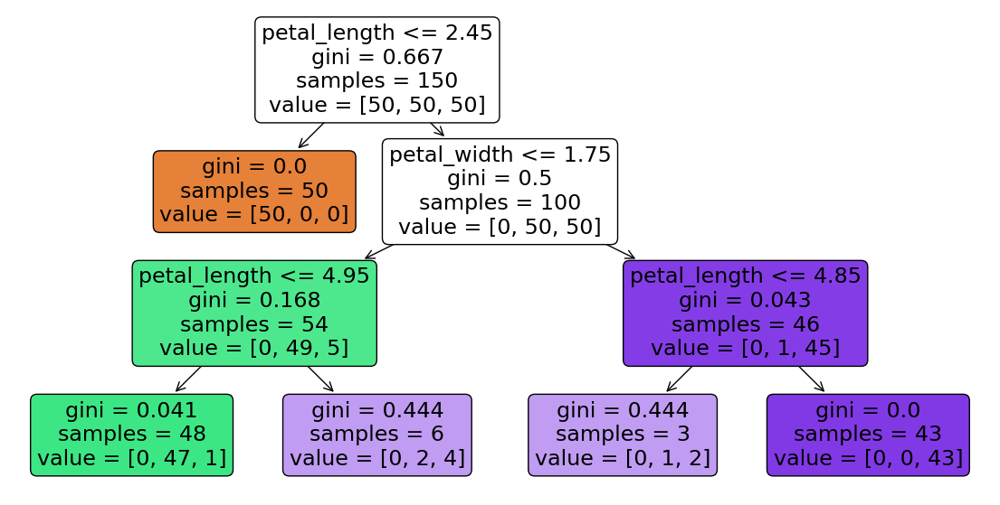

In [13]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values
dtc = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=3)# <------------max_depth
dtc.fit(X,y)
plt.figure(figsize=(14,7))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

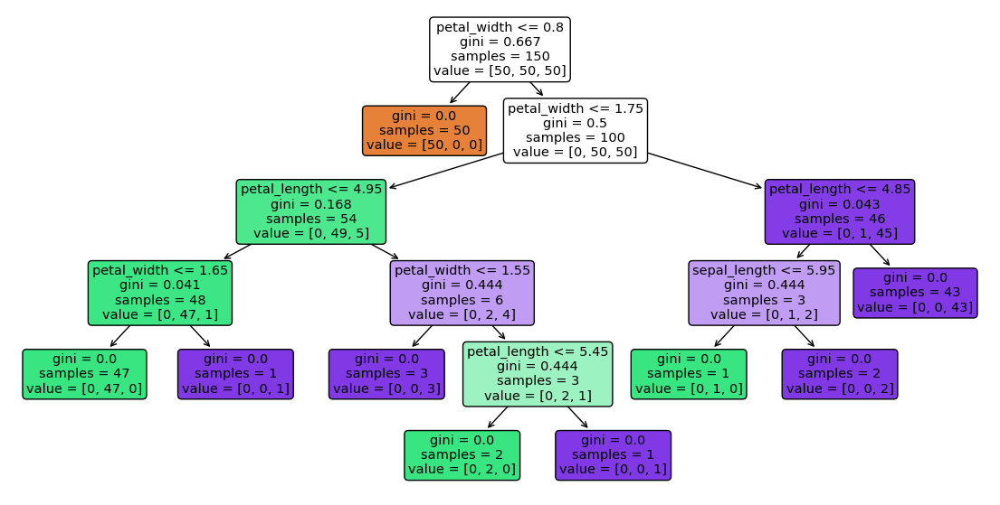

In [14]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values
dtc = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=10)# <------------max_depth ke ek aur mtlb hota vo ye ki max us depth ja sakta hai na ki 10 jaayega hi jayega
dtc.fit(X,y)
plt.figure(figsize=(14,7))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

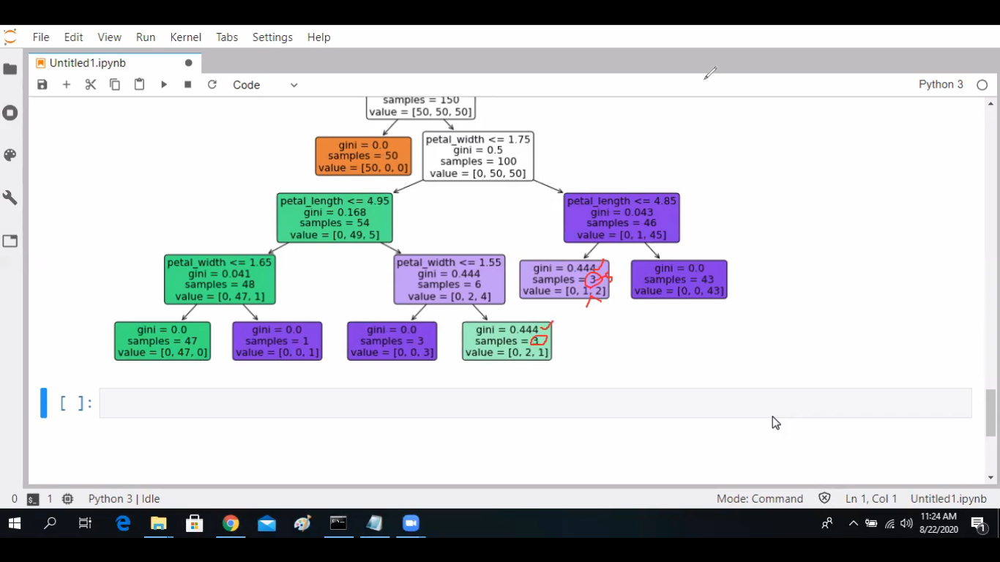

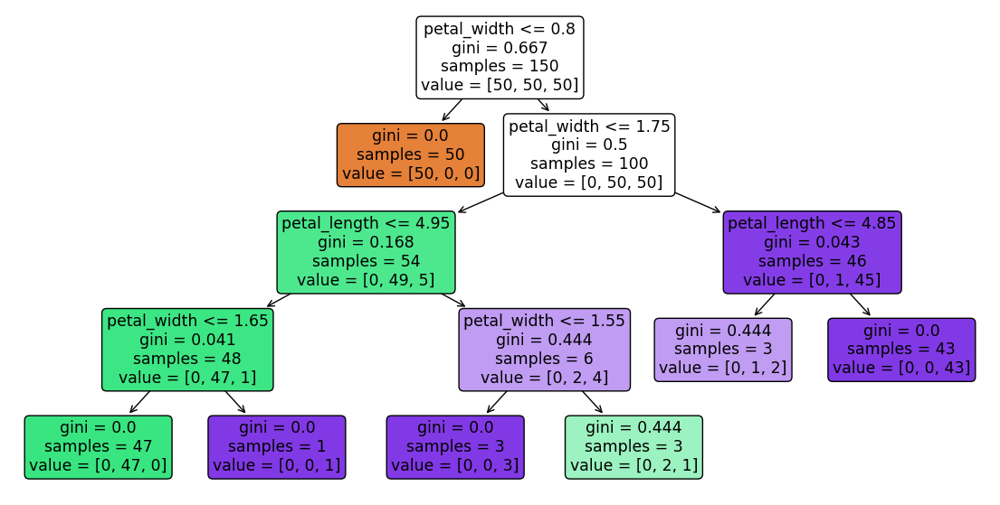

In [15]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values
dtc = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=10,min_samples_split=5)
dtc.fit(X,y)
plt.figure(figsize=(14,7))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

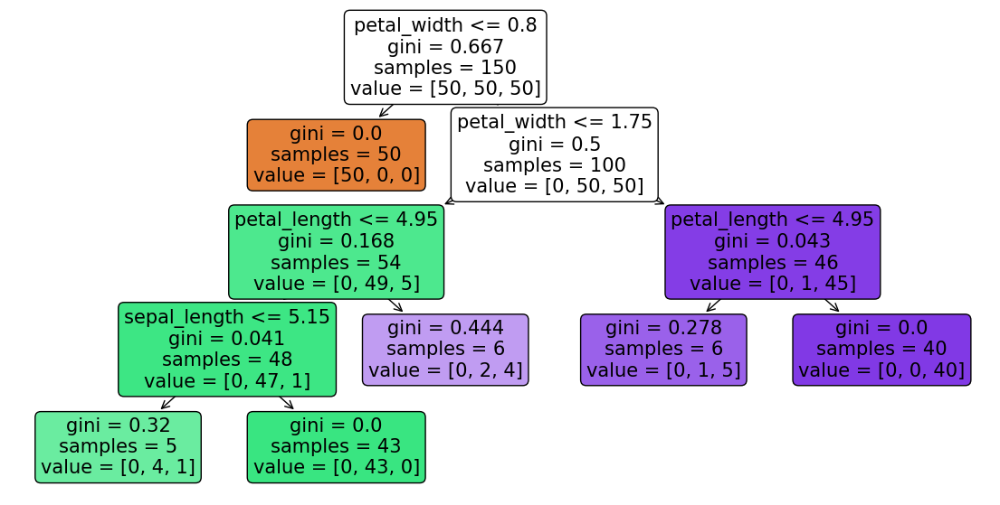

In [16]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values
dtc = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=10,min_samples_split=5,
                             min_samples_leaf=5)
dtc.fit(X,y)
plt.figure(figsize=(14,7))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

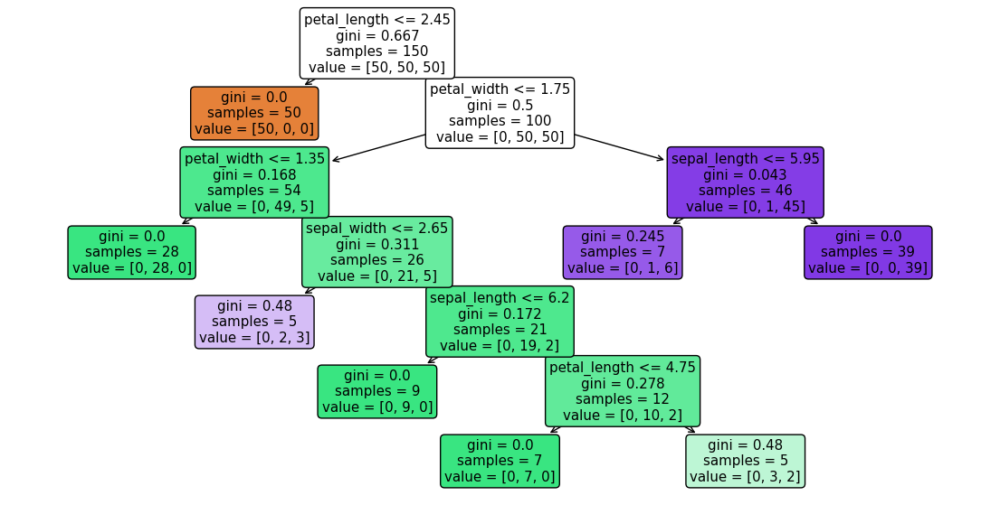

In [17]:
X = df.iloc[:,:-1].values
y = df.iloc[:,-1].values
dtc = DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=10,min_samples_split=5,
                             min_samples_leaf=5,max_features=2)# max_featue ka mtlb ye ki out of total feature in the dataset only 2 features will be considered
dtc.fit(X,y)
plt.figure(figsize=(14,7))
plot_tree(dtc,feature_names=df.columns[:-1],filled=True,rounded=True) 
plt.show()

In [18]:
dtc.feature_importances_ # importance of features of each  features in the dataset on the basis of the value

array([0.00564739, 0.02201273, 0.54482478, 0.42751511])

# commonaly used hyperparameters

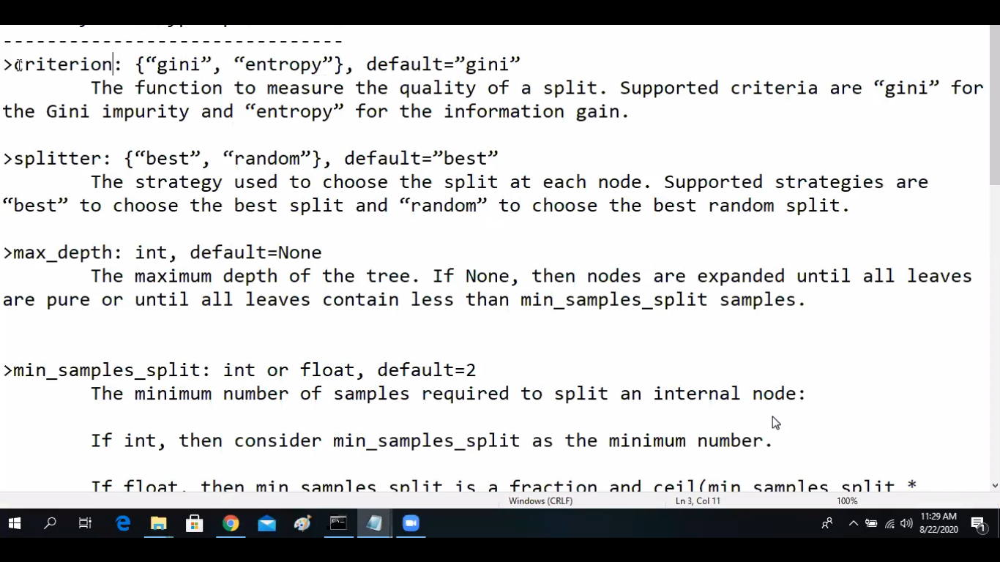

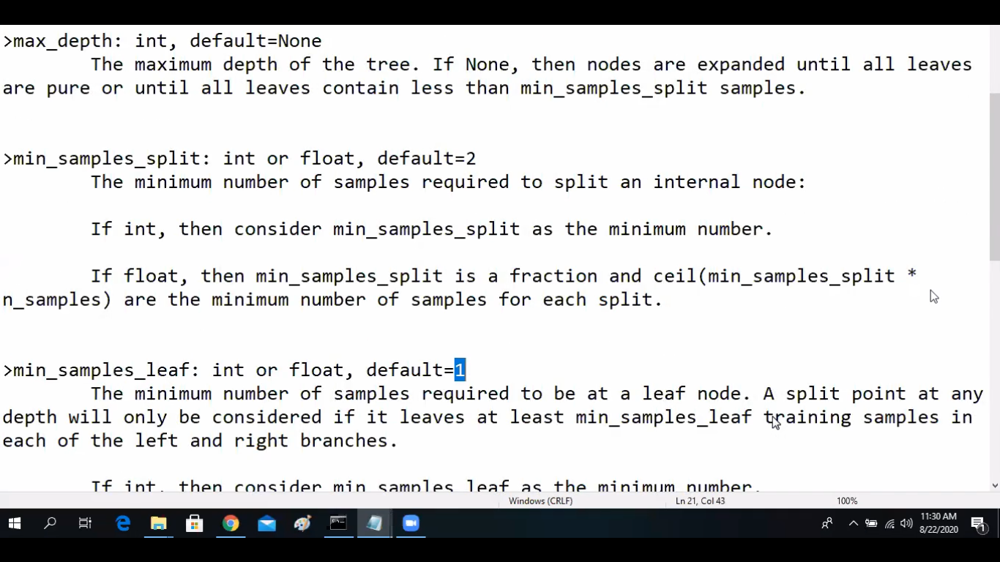

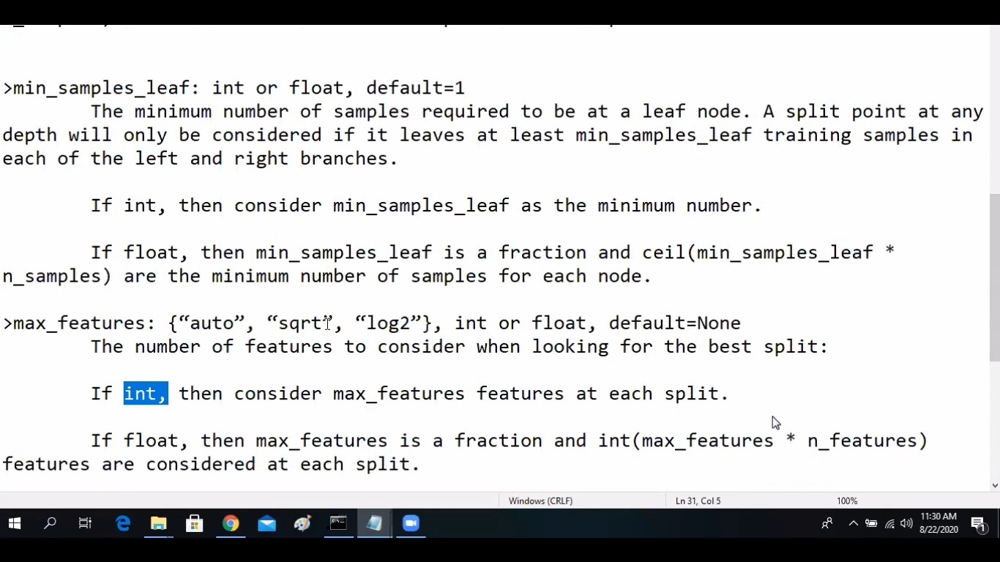

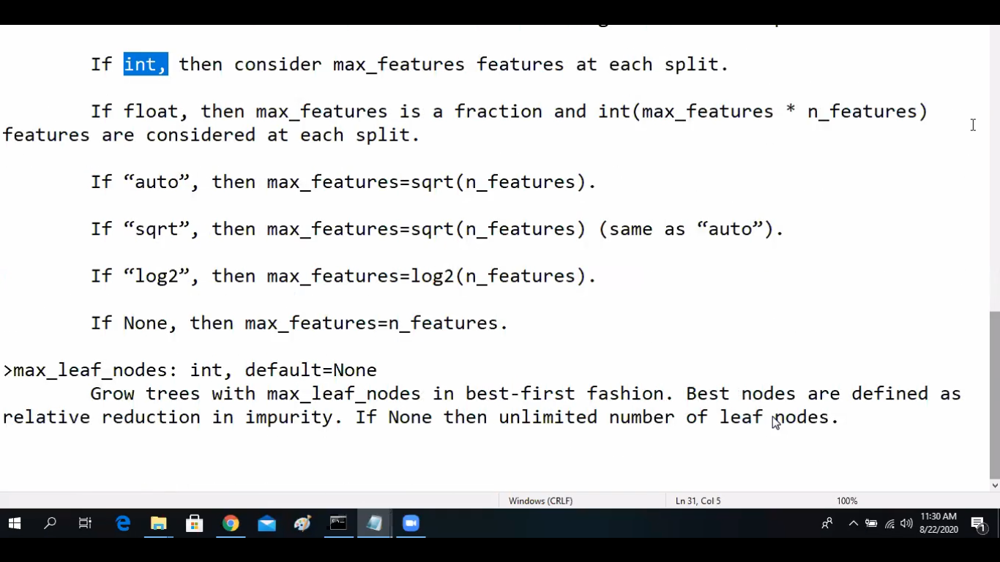

#                                          # Lecture-2

## how splitter = 'entropy' works

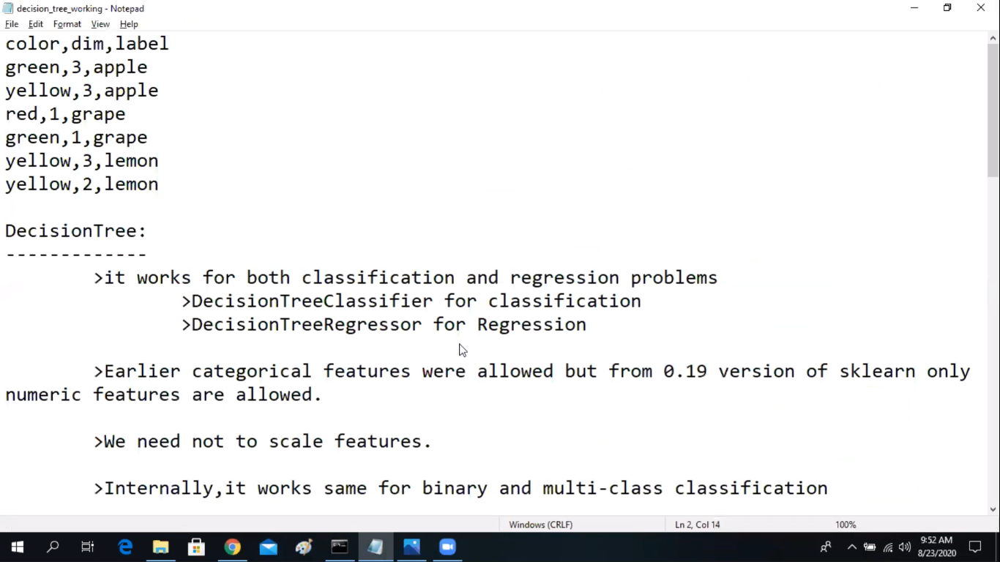

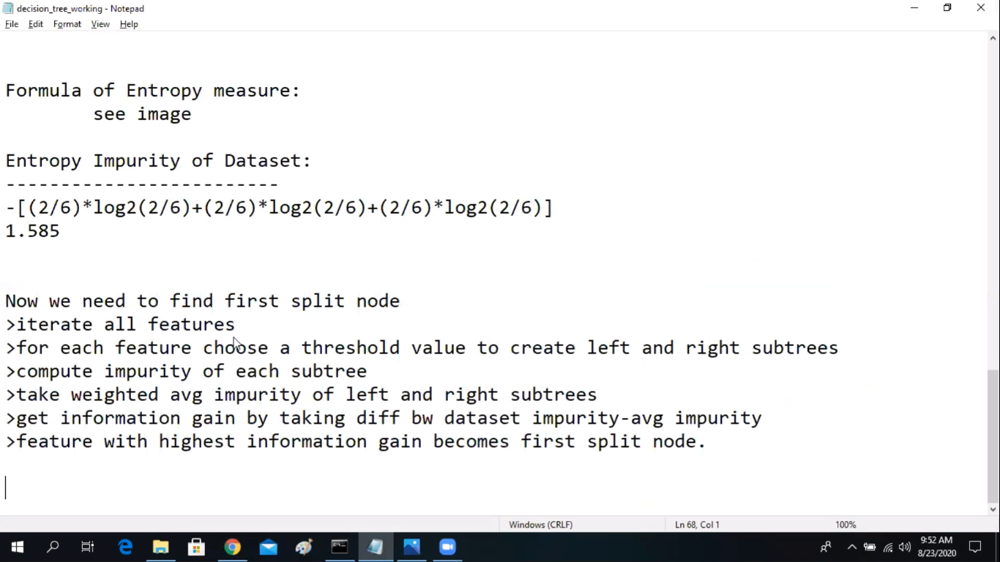

### Kya DecisionTree me overfitting ki problem ho sakti hai?

In [20]:
df = pd.read_csv('/home/echelon/machine_learning_personal/machine learning/dataset/classification/fruits.csv')


In [21]:
df

,diameter,weight,FruitName
0,3.0,30,Banana
1,6.0,100,Apple
2,6.1,95,Apple
3,3.2,35,Banana
4,5.5,80,Apple
5,7.1,120,Banana
6,2.5,60,Banana
7,2.3,100,Banana
8,4.8,70,Apple
9,4.8,79,Apple


### target column catogorical bhi chalega jaruri nhi hai ki numerical me change kro ise

In [26]:
from sklearn.model_selection import train_test_split
X = df.iloc[:,:-1].values
y = df.iloc[:,-1] 

X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=10)

dtc = DecisionTreeClassifier() 
dtc.fit(X_train,y_train)

print(f'Training Score : {dtc.score(X_train,y_train)}')
print(f'Testing Score : {dtc.score(X_test,y_test)}')

Training Score : 1.0
Testing Score : 0.8333333333333334


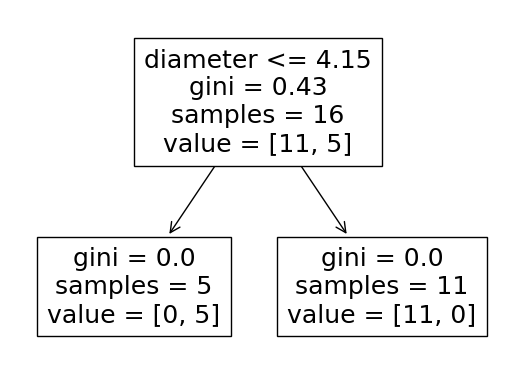

In [28]:
plot_tree(dtc,feature_names=df.columns[:-1])
plt.show()

In [30]:
test_sample = [3.2,40]

dtc.predict([test_sample])

array(['Banana'], dtype=object)

In [31]:
test_sample = [4.16,40]

dtc.predict([test_sample])

array(['Apple'], dtype=object)

In [53]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()


X_train_new = sc.fit_transform(X_train) 
X_test_new = sc.transform(X_test)

dtc = DecisionTreeClassifier(max_depth=4,random_state=2) # yhan ye apne ander se randomness ka concept use krta hai DecisionTreeClassifier jitni bar run kroge utni bar output different aayega to avoid it there is an argumen random_state
dtc.fit(X_train_new,y_train)  # <--------------- scaling ka koi fark nhi pr rha hai 

print(f'Training Score : {dtc.score(X_train_new,y_train)}')
print(f'Testing Score : {dtc.score(X_test_new,y_test)}')

Training Score : 1.0
Testing Score : 0.8333333333333334


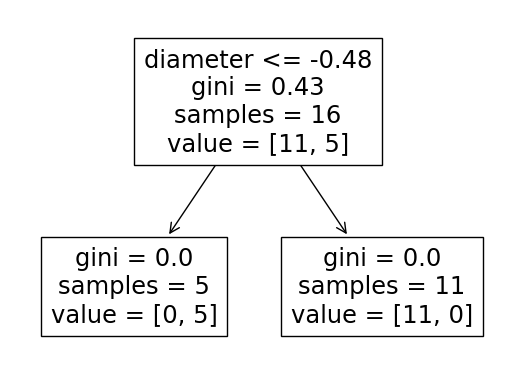

In [54]:
plot_tree(dtc,feature_names=df.columns[:-1])
plt.show()

In [75]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=10)


dtc = DecisionTreeClassifier() 
dtc.fit(X,y)  #  pura data dene pe score achcha aa rha hai

print(f'Training Score : {dtc.score(X_train,y_train)}')
print(f'Testing Score : {dtc.score(X_test,y_test)}')

Training Score : 1.0
Testing Score : 1.0


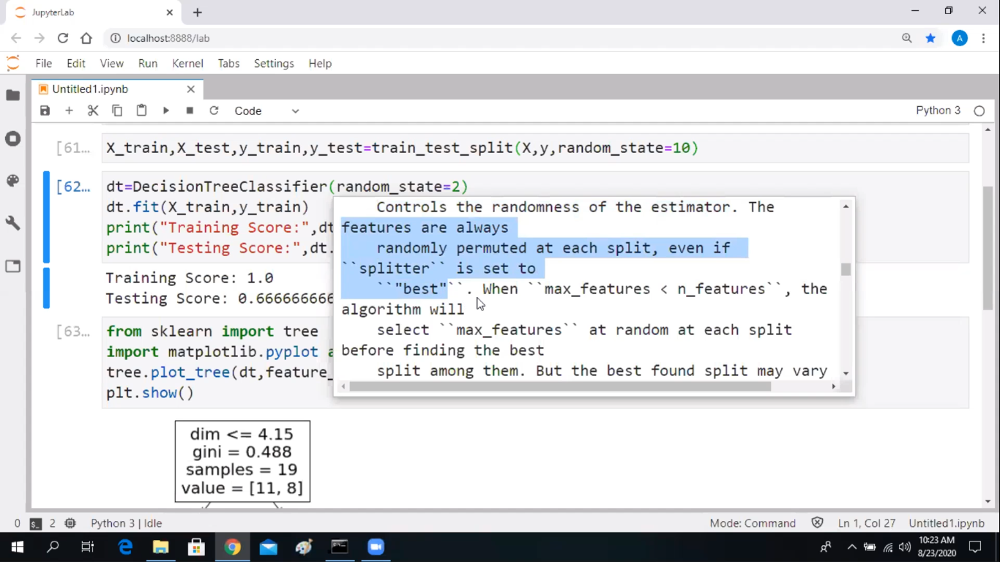

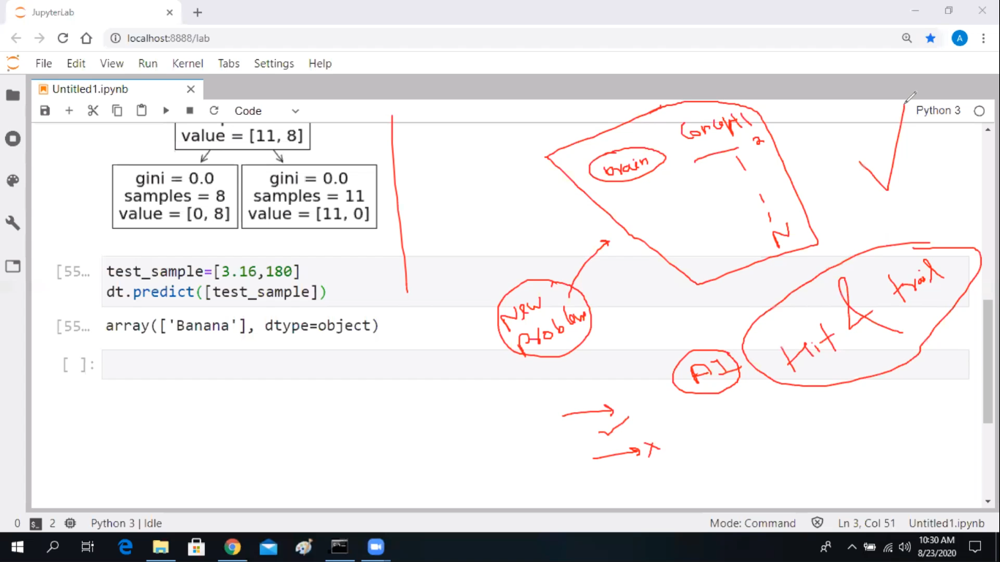

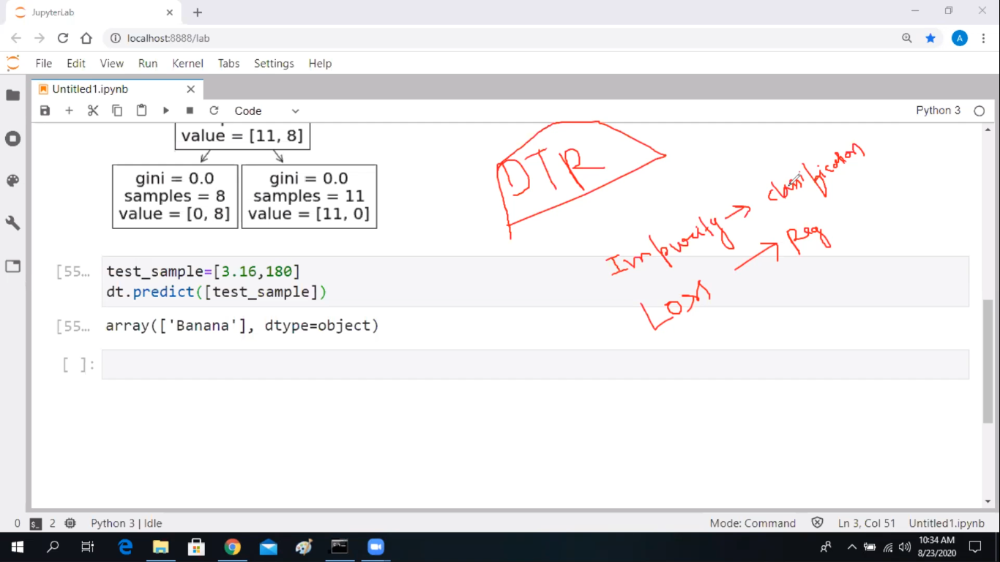

# -----------------DecisionTreeRegressor-----------------

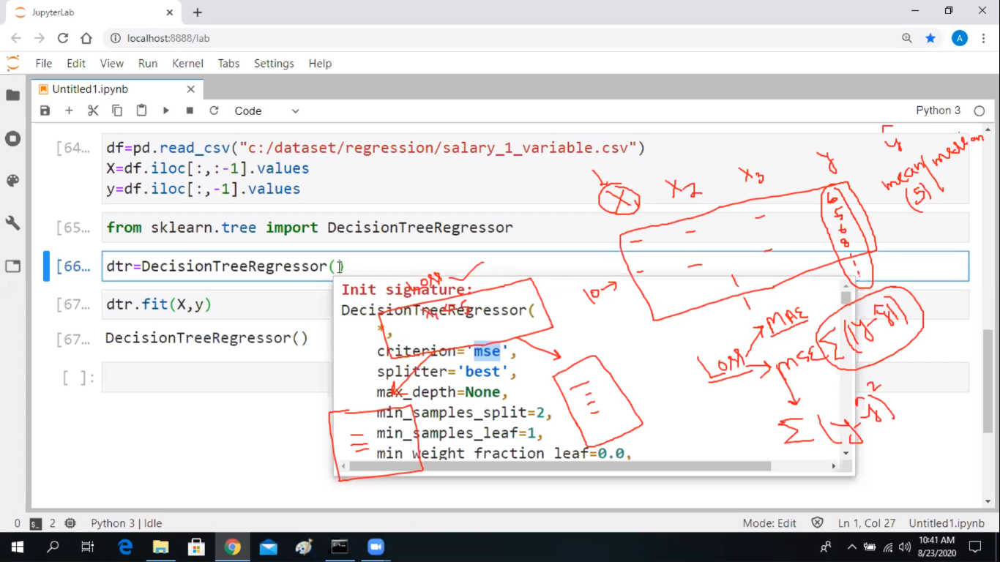

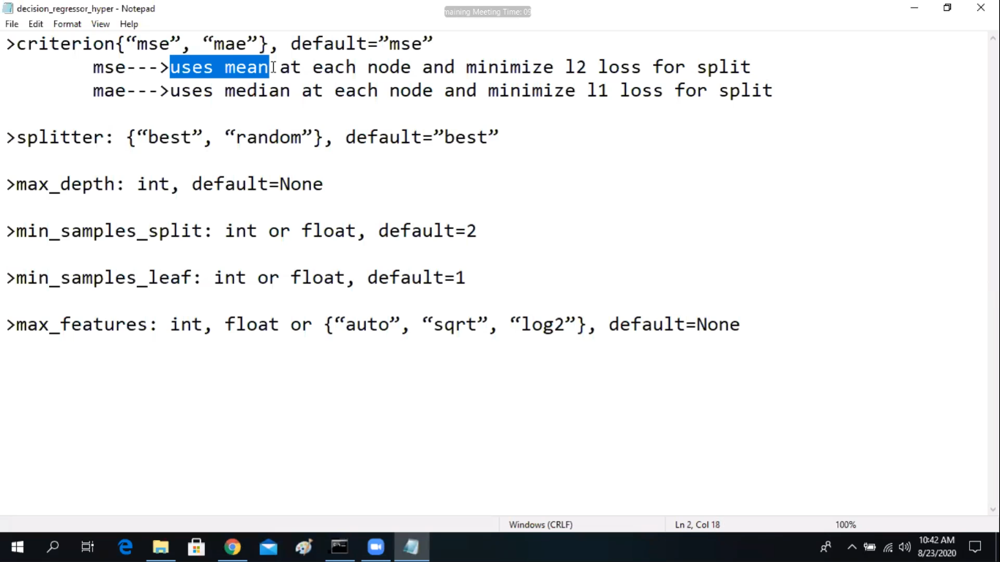